# A Hierarchical Model of Honeybee Waggle-Dances
---

## Details

&ensp;AUTHOR:&emsp;   James Foster &emsp; 2025 03 14

MODIFIED:&emsp; James Foster &emsp; 2026 05 20

DESCRIPTION:&emsp; Fit a hierarchical maximum-likelihood von Mises to honeybee waggle-run angles.
Modified from [beetles.ipynb](https://github.com/jgraving/unwrap/notebooks/)

            
INPUTS:&emsp;   `'colour_dance_reorg.csv'`
            
OUTPUTS:&emsp;  Plots and test statistics

CHANGES: - More specific Python environment for PyMC x unwrap

REFERENCES:
- Sayin S, ... Graving JM, $\textit{et~al}$. (2025)
The behavioral mechanisms governing collective motion in swarming locusts.
$\textit{Science}$ 387,995-1000
DOI:[10.1126/science.adq7832](https://doi.org/10.1126/science.adq7832)

- Graving JM, Sayin S, Costelloe BR, Goldshtein A & Foster JJ. 
Unwrapping circular statistics with Bayesian multilevel models.

- Seyboldt, A., Carlson, E. L., & Carpenter, B. (2026).
Preconditioning Hamiltonian Monte Carlo by minimizing Fisher Divergence. arXiv preprint arXiv:2603.18845.

- Capretto, T., Piho, C., Kumar, R., Westfall, J., Yarkoni, T., & Martin, O. (2022)
`Bambi`: A simple interface for fitting Bayesian linear models in Python.
*Journal of Statistical Software* 103(15), 1-29. doi:10.18637/jss.v103.i15

---

# First set up the required packages
Don't forget to make sure the the kernel is running in a `conda` environment.
To fit models using `g++` (recommended for speed) make sure `m2w64-toolchain` is installed on Windows.

In [ ]:
import sys

# 20260520 - Modified for nutpie compliance with strict NumPy < 2 constraints
requirements = """
numpy>=1.26.4,<2.0.0
pandas==2.2.2
scipy==1.13.1
arviz==0.19.0
bambi==0.14.0
pymc==5.16.2
matplotlib==3.8.4
formulae==0.5.4
numba>=0.59.1,<=0.60.0
nutpie
netcdf4>=1.6.5,<1.7.0
h5py>=3.10.0,<4.0.0
git+https://github.com/jgraving/unwrap.git
"""

# Write it to a file
with open("nutpie_unwrap_requirements.txt", "w") as f:
    f.write(requirements.strip() + "\n")

# Install everything from the file
!{sys.executable} -m pip install -r nutpie_unwrap_requirements.txt --no-cache

%set_env PYTENSOR_FLAGS=blas__ldflags='-llapack -lblas -lcblas'

  Cloning https://github.com/jgraving/unwrap.git to /private/var/folders/nq/smdrxv810_z_tfcmgmg5gkb00000gn/T/pip-req-build-ecrh5twm
  Running command git clone --filter=blob:none --quiet https://github.com/jgraving/unwrap.git /private/var/folders/nq/smdrxv810_z_tfcmgmg5gkb00000gn/T/pip-req-build-ecrh5twm
  Resolved https://github.com/jgraving/unwrap.git to commit 3e701175b665a12f4a0dcda6643aef9ea4b7aecf
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
env: PYTENSOR_FLAGS=blas__ldflags='-llapack -lblas -lcblas'


Report packages installed in enviroment.

In [2]:
!{sys.executable} -m pip list

Package                 Version
----------------------- -----------
absl-py                 2.4.0
appnope                 0.1.4
arviz                   0.19.0
asttokens               3.0.1
attrs                   26.1.0
bambi                   0.14.0
cachetools              7.1.3
certifi                 2026.4.22
cftime                  1.6.5
cloudpickle             3.1.2
comm                    0.2.3
cons                    0.4.7
contourpy               1.3.3
cycler                  0.12.1
debugpy                 1.8.20
decorator               5.3.1
dm-tree                 0.1.10
etuples                 0.3.10
executing               2.2.1
filelock                3.29.0
fonttools               4.63.0
formulae                0.5.4
graphviz                0.21
h5netcdf                1.8.1
h5py                    3.16.0
ipykernel               7.2.0
ipython                 9.13.0
ipython_pygments_lexers 1.1.1
jedi                    0.19.2
jupyter_client          8.8.0
jupyter_core     

# Set up custom functions
Create a function for plotting circular model output.

In [3]:
import matplotlib.pyplot as plt
import arviz as az

def plot_circular_trace(idata, 
                        vars, 
                        cvars, 
                        cvar_units='degrees', 
                        save_trans=False):
    """
    Transforms circular posterior variables from radians to degrees (inverted 
    for clockwise plotting) and plots the ArviZ trace.
    
    Parameters:
    -----------
    idata : arviz.InferenceData
        The ArviZ InferenceData object containing the posterior samples.
    vars : list of str
        The full list of variable names to plot in the trace.
    cvars : list of str
        The subset of variable names that are circular and need transformation.
    cvar_units : str, optional
        Units for the circular variables (e.g., 'degrees' or 'radians'). Default is 'degrees'.
    save_trans : bool, optional
        Whether to return the transformed InferenceData object. Default is True.
        
    Returns:
    --------
    idata_trans : arviz.InferenceData or None
        A copy of the InferenceData object with transformed circular variables if save_trans=True, 
        otherwise None.
    """
    # Transform the circular data for interpretability
    idata_trans = idata_interaction.copy()  # set up a variable for transformed data
    
    if cvar_units == 'degrees':
        for cvar in cvars:
            # Convert each to degrees and invert to plot clockwise
            idata_trans.posterior[cvar] = -180 * idata_trans.posterior[cvar] / np.pi 

    # Generate the trace plot
    az.plot_trace(
        idata_trans,
        var_names=vars,
        circ_var_names=cvars,
        circ_var_units=cvar_units
    ) 
    
    plt.tight_layout()
    plt.show()
    
    if save_trans:
        return idata_trans
    
    return None

# Prepare the data
## Import and format the data
Load the preprocessed data from CSV and convert to radians. Relabel the two conditions in each factor to binary.

In [4]:

import pandas as pd
import numpy as np
from unwrap.link.numpy import shifted_modulo

# Load the file
file_path = '1Data/colour_dance_reorg.csv'#JJF windows is having trouble finding this file
df = pd.read_csv(file_path, sep=',')

# Create a binary indicator for the light intensity (1 for 'low', 0 for 'high')
df['B'] = df['brightn'].apply(lambda x: 1 if 'l' in x else 0)
# Create a binary indicator for the light colour (1 for 'UV', 0 for 'green')
df['C'] = df['colour'].apply(lambda x: 1 if 'u' in x else 0)
# Rename sun azimuth to use capitalised label
df['SunAz'] = df['sun_az_rad']
# Rename run to use capitalised label
df['Run'] = df['run']

# Convert the dance angle column to the correct format (already radians?)
df['angle'] = pd.to_numeric(df['angle'], errors='coerce')  # Convert non-numeric values (e.g., 'NA') to NaN

# Normalise all angles to be between -pi and pi (should be already)
df['angle'] = df['angle'].apply(lambda x: shifted_modulo(x) if pd.notnull(x) else x)
df['sun_az_rad'] = df['sun_az_rad'].apply(lambda x: shifted_modulo(x) if pd.notnull(x) else x)

# Keep only the relevant columns and drop rows with missing values
# df = df[['angle','ID', 'B', 'C', 'Run','SunAz']].dropna().copy()
df = df[['angle','ID', 'B', 'C', 'Run','SunAz']].copy()#we don't need to drop NA as we're not using SunAz
df.reset_index(drop=True, inplace=True)

# Rename columns: change 'ID' to 'Individual'
df = df.rename(columns={'ID': 'Individual'})
df['Individual'] = df['Individual'].astype('category')

# Simplify to codes
df['Individual'] = df['Individual'].cat.codes + 1
#save to align with raw data in R
df.to_feather('1Data/colour_dance_reorg.feather')

df.head()

,angle,Individual,B,C,Run,SunAz
0,1.570796,3,1,1,1,-2.647205
1,-0.087266,3,1,1,2,-2.647205
2,-0.349066,3,1,1,3,-2.647205
3,0.698132,3,1,1,4,-2.647205
4,-0.349066,3,1,1,5,-2.647205


## Inspect the data
Use Jake's plots to show the repeated angles across individuals.
Maybe limit this to just 10 individuals for now.

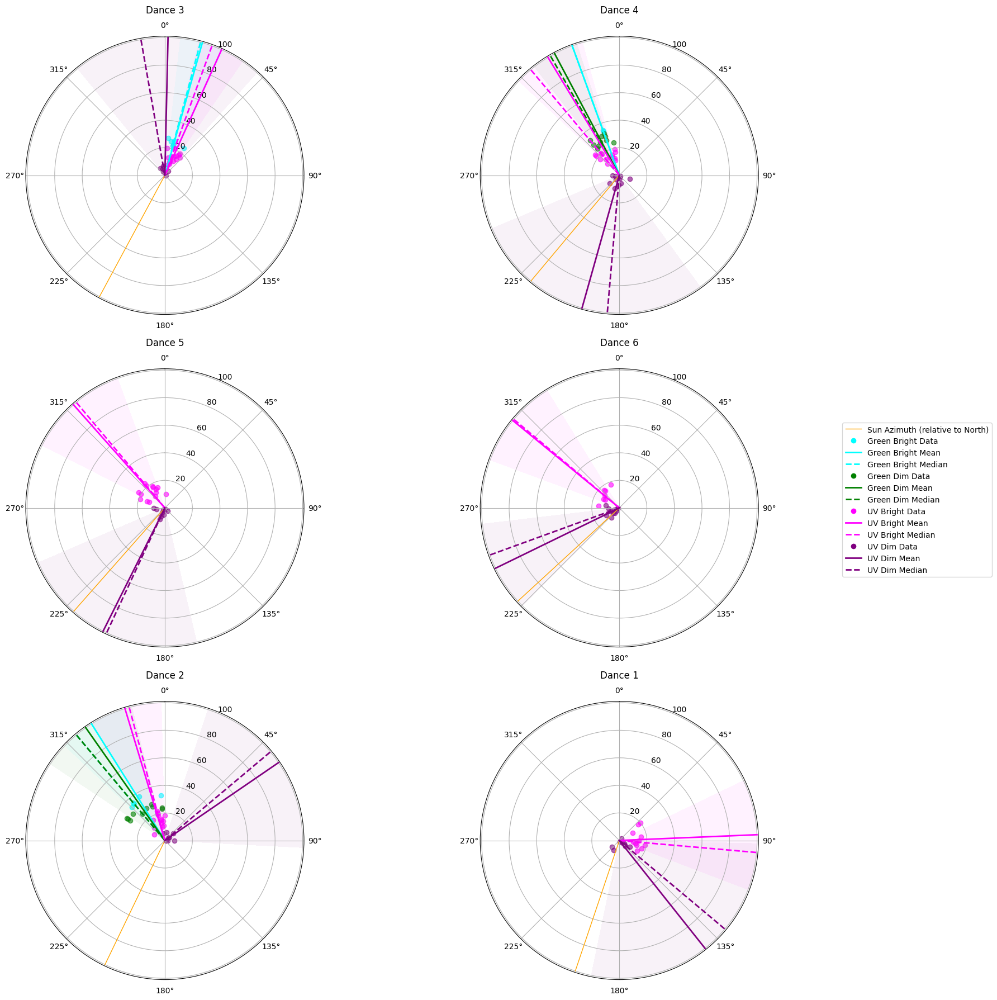

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import circmean, circstd
from matplotlib.lines import Line2D

# Helper function to compute the circular median.
def circ_median(angles):
    angles = np.sort(angles)
    diffs = np.abs(np.angle(np.exp(1j * (angles[:, None] - angles[None, :]))))
    sum_diffs = np.sum(diffs, axis=1)
    return angles[np.argmin(sum_diffs)]

# Helper function to scatter-plot data for one condition.
def plot_scatter(ax, data, angle_col, radial_col, color, label):
    if not data.empty:
        ax.scatter(data[angle_col], data[radial_col],
                   color=color, alpha=0.6, label=label)

# Helper function to compute and plot summary statistics.
# It plots a solid vertical line at the circular mean and a dashed vertical line at the circular median,
# both in the specified color. It also fills the region ± the circular standard deviation.
def plot_summary_stats(ax, angles, radial_max, color):
    # Compute circular mean, median, and standard deviation.
    mean_val = circmean(angles, high=np.pi, low=-np.pi)
    median_val = circ_median(angles)
    std_val = circstd(angles, high=np.pi, low=-np.pi, normalize=True)
    
    # Plot mean (solid) and median (dashed).
    ax.plot([mean_val, mean_val], [0, radial_max], color=color, linewidth=2)
    ax.plot([median_val, median_val], [0, radial_max], color=color, linewidth=2, linestyle='--')
    
    # Fill the region between mean minus std and mean plus std.
    theta_vals = np.linspace(mean_val - std_val, mean_val + std_val, 100)
    r_vals = np.linspace(0, radial_max, 100)
    Theta, R = np.meshgrid(theta_vals, r_vals)
    ax.contourf(Theta, R, np.ones_like(Theta), alpha=0.05, colors=[color]) # was alpha = 0.2, but covers too much data
    
    return mean_val, median_val, std_val

# Get unique individual IDs.
unique_individuals = df['Individual'].unique()
unique_individuals = unique_individuals[range(0,6)] # for now just the 1st 6 

# Create a grid of polar subplots.
n_plots = len(unique_individuals)
n_rows, n_cols = ( np.intc(n_plots/2) , 2  ) # Adjust grid dimensions as needed.
fig, axes = plt.subplots(n_rows, n_cols, subplot_kw={'projection': 'polar'}, figsize=(18, np.intc(n_plots*3)))
axes = axes.flatten()

# radial_max = 10*4  # Maximum radial value
radial_max = np.max(df['Run'])  # Maximum radial value (maximum runs)

# Plot for each individual.
for idx, individual in enumerate(unique_individuals):
    ax = axes[idx]
    # Set axes to geographic format (clockwise, 0° at the top)
    ax.set_theta_direction(-1)#reverse to clockwise
    ax.set_theta_zero_location('N')#place 0° at the top
    individual_data = df[df['Individual'] == individual]
    
    # Separate Light bright and Light dim data (drop NaNs in angle).
    data_on = individual_data[individual_data['B'] == 0].dropna(subset=['angle'])
    data_off = individual_data[individual_data['B'] == 1].dropna(subset=['angle'])
    # Separate bright data.
    data_gh = data_on[data_on['C'] == 0]
    data_uh = data_on[data_on['C'] == 1]
    # Separate dim data.
    data_gl = data_off[data_off['C'] == 0]
    data_ul = data_off[data_off['C'] == 1]
    
    # Scatter-plot data.
    plot_scatter(ax, data_gh, 'angle', 'Run', 'cyan', 'Green Bright')
    plot_scatter(ax, data_gl, 'angle', 'Run', 'green', 'Green Dim')
    plot_scatter(ax, data_uh, 'angle', 'Run', 'magenta', 'UV Bright')
    plot_scatter(ax, data_ul, 'angle', 'Run', 'purple', 'UV Dim')
    
    #Plot the sun's azimuth for reference
    ax.plot(individual_data['SunAz'].values[range(0,2)], [0, radial_max], color='orange', linewidth=1)
    # Plot summary statistics for each condition.
    if not data_gh.empty:
        plot_summary_stats(ax, data_gh['angle'].values, radial_max, 'cyan')
    if not data_gl.empty:
        plot_summary_stats(ax, data_gl['angle'].values, radial_max, 'green')
    if not data_uh.empty:
        plot_summary_stats(ax, data_uh['angle'].values, radial_max, 'magenta')
    if not data_ul.empty:
        plot_summary_stats(ax, data_ul['angle'].values, radial_max, 'purple')
    
    ax.set_title(f'Dance {individual}', pad=30)
    ax.set_ylim(0, radial_max + 1)
    # Remove individual legends from each subplot.
    ax.legend().set_visible(False)

# Create a shared custom legend.
legend_handles = [
    # For sun azimuth (orange)
    Line2D([0], [0], color = 'orange', lw = 1, label = 'Sun Azimuth (relative to North)'),
    # For green bright (cyan)
    Line2D([0], [0], marker='o', color='w', markerfacecolor='cyan', markersize=8, label='Green Bright Data'),
    Line2D([0], [0], color='cyan', lw=2, label='Green Bright Mean'),
    Line2D([0], [0], color='cyan', lw=2, linestyle='--', label='Green Bright Median'),
    # For green dim (green)
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=8, label='Green Dim Data'),
    Line2D([0], [0], color='green', lw=2, label='Green Dim Mean'),
    Line2D([0], [0], color='green', lw=2, linestyle='--', label='Green Dim Median'),
    # For UV bright (magenta)
    Line2D([0], [0], marker='o', color='w', markerfacecolor='magenta', markersize=8, label='UV Bright Data'),
    Line2D([0], [0], color='magenta', lw=2, label='UV Bright Mean'),
    Line2D([0], [0], color='magenta', lw=2, linestyle='--', label='UV Bright Median'),
    # For UV dim (purple)
    Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=8, label='UV Dim Data'),
    Line2D([0], [0], color='purple', lw=2, label='UV Dim Mean'),
    Line2D([0], [0], color='purple', lw=2, linestyle='--', label='UV Dim Median'),
]

# Add one shared legend to the right of the figure.
fig.legend(handles=legend_handles, loc='center right', bbox_to_anchor=(1.10, 0.5), fontsize='medium')

plt.tight_layout()
plt.show()

# Fit a circular model with individual effects but no interactions
To begin with fit a model with only the effects of different individuals, light intensities and LED colours.

$\mu \sim$ B + C + (1 + B + C + B:C |Individual)

$\kappa \sim$ B + C + (1 + B + C + B:C |Individual)


In [ ]:
import numpy as np
import pandas as pd
import bambi as bmb
import arviz as az
import matplotlib.pyplot as plt

from unwrap.link.bambi import LINKS
from unwrap.link.numpy import inverse_softplus
from unwrap.prior import CircularUniformPrior
from pymc import VonMises
from scipy.stats import vonmises, circstd

# Define the model formula with updated, capitalized variable names.
formula_interaction = bmb.Formula(
    "angle ~ B + C + B:C + (1 + B + C + B:C |Individual)",
    "kappa ~ B + C + B:C + (1 + B + C + B:C |Individual)",
)


# Specify priors for the model with capitalized keys and updated variable names.
# priors_interaction = {
#     # Fixed effects for μ:
#     "Intercept": CircularUniformPrior(), # Works
#     "B": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
#     "C": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
#     "B:C": bmb.Prior("Normal", mu= 0, sigma=np.pi/6), # Works 
#     # Individual-level effects for μ: #bias to high kappa appears to cause divergent transitions here; large sigma slows estimation; mu=log(30), sigma=0.1 appears to be a good compromise.
#     "1|Individual": bmb.Prior(
#         "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # Informative prior, individuals close to pop mean circsd ~10° # do not change!
#     ),
#     "B|Individual": bmb.Prior(
#         "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.1) # # Works
#     ),
#     "C|Individual": bmb.Prior(
#         "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.1) # # Works
#     ),
#     "B:C|Individual": bmb.Prior(
#         "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(10), sigma=0.1) # # Works
#     ),#Test
#     # Priors for the κ-model (inside the "kappa" dictionary):
#     "kappa": {
#         # Fixed effects for κ:
#         "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=0.5), # Works
#         "B": bmb.Prior("Normal", mu=0, sigma=0.3), # Works
#         "C": bmb.Prior("Normal", mu=0, sigma=0.3), # Works
#         "B:C": bmb.Prior("Normal", mu=0, sigma=1.0), # Works
#         # Individual-level effects for κ:
#         "1|Individual": bmb.Prior(
#             "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) # Works
#             ), #Works
#         "B|Individual": bmb.Prior(
#             "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3) ## Works
#         ),
#         "C|Individual": bmb.Prior(
#             "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3) ## Works
#         ),
#         "B:C|Individual": bmb.Prior(
#             "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) ## Works
#         ),
#         }
# }
priors_interaction = {
    # Fixed effects for μ:
    "Intercept": CircularUniformPrior(), # Test
    "B": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    "B:C": bmb.Prior("Normal", mu= 0, sigma=np.pi/2), # Test 
    # Individual-level effects for μ: #bias to high kappa appears to cause divergent transitions here; large sigma slows estimation; mu=log(30), sigma=0.1 appears to be a good compromise.
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # Informative prior, individuals close to pop mean circsd ~10° # do not change!
    ),
    "B|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # # Test
    ),
    "C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # # Test
    ),
    "B:C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # # Test
    ),#Test
    # Priors for the κ-model (inside the "kappa" dictionary):
    "kappa": {
        # Fixed effects for κ:
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), # Test
        "B": bmb.Prior("Normal", mu=0, sigma=0.5), # Works
        "C": bmb.Prior("Normal", mu=0, sigma=0.5), # Works
        "B:C": bmb.Prior("Normal", mu=0, sigma=0.5), # Works
        # Individual-level effects for κ:
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) # Test
            ), #Works
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) ## Test
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) ## Test
        ),
        "B:C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5) ## Test
        ),
        }
}

# Build the model using the updated formula and priors.
model_interaction = bmb.Model(
    formula_interaction,
    df,
    family="vonmises",
    priors=priors_interaction,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

print(model_interaction)

# Fit the model using Bambi's native nutpie interface
idata_interaction = model_interaction.fit(
    draws=2000,
    tune=1000,
    nuts_sampler="nutpie",  #build and route via nutpie automatically
    target_accept=0.98,
)

# Save model.
az.to_netcdf(idata_interaction, "GUV_unwrap_model.nc")

       Formula: angle ~ B + C + B:C + (1 + B + C + B:C |Individual)
                kappa ~ B + C + B:C + (1 + B + C + B:C |Individual)
        Family: vonmises
          Link: mu = shifted_modulo
                kappa = softplus
  Observations: 6231
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ CircularUniform()
            B ~ Normal(mu: 0.0, sigma: 0.2618)
            C ~ Normal(mu: 0.0, sigma: 0.2618)
            B:C ~ Normal(mu: 0.0, sigma: 0.5236)
        
        Group-level effects
            1|Individual ~ VonMises(mu: 0.0, kappa: LogNormal(mu: 3.4012, sigma: 0.6))
            B|Individual ~ VonMises(mu: 0.0, kappa: LogNormal(mu: 3.4012, sigma: 0.1))
            C|Individual ~ VonMises(mu: 0.0, kappa: LogNormal(mu: 3.4012, sigma: 0.1))
            B:C|Individual ~ VonMises(mu: 0.0, kappa: LogNormal(mu: 2.3026, sigma: 0.1))
    target = kappa
        Common-level effects
            kappa_Intercept ~ Normal(mu: 2.9489, sigma: 0.5)
      

/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.04,255
,3000,0,0.04,127
,3000,0,0.04,127
,3000,0,0.05,127


'GUV_unwrap_model.nc'

## Check convergence heuristics



In [7]:
#check convergence heuristics
az.summary(
    idata_interaction, 
    var_names=["Intercept", #slightly right shifted, should converge to around 0.26
               "B", 
                "C",
                "B:C",
                "kappa_Intercept",
               "kappa_B",
                "kappa_C",
                "kappa_B:C",
                ],
    circ_var_names=["Intercept",
                    "B",
                    "C",
                    "B:C",
                    ]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.197,0.087,0.027,0.356,0.005,0.006,113.0,768.0,1.05
B,-0.433,0.067,-0.555,-0.302,0.001,0.001,2088.0,3503.0,1.00
C,0.071,0.037,0.000,0.137,0.000,0.001,2305.0,3822.0,1.00
B:C,-1.201,0.098,-1.388,-1.017,0.001,0.002,1185.0,2751.0,1.00
kappa_Intercept,5.452,0.275,4.937,5.980,0.006,0.004,2144.0,4060.0,1.00
kappa_B,-1.800,0.282,-2.384,-1.308,0.006,0.004,2195.0,3673.0,1.00
kappa_C,1.884,0.253,1.397,2.347,0.005,0.004,2432.0,4672.0,1.00
kappa_B:C,-3.982,0.431,-4.802,-3.188,0.012,0.009,1217.0,2780.0,1.00


In [8]:
#check convergence heuristics on random effects
az.summary(
    idata_interaction, 
    var_names=[
        "1|Individual_kappa",
        "B|Individual_kappa",
        "C|Individual_kappa",
        "B:C|Individual_kappa",
        "kappa_1|Individual_sigma",
        "kappa_B|Individual_sigma",
        "kappa_C|Individual_sigma",
        "kappa_B:C|Individual_sigma",
                ],
    # filter_vars='like',
    # circ_var_names=[]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.574,0.156,1.287,1.875,0.001,0.001,13129.0,4379.0,1.00
B|Individual_kappa,24.348,2.567,19.574,29.195,0.039,0.028,4210.0,5393.0,1.00
C|Individual_kappa,29.300,2.918,23.876,34.730,0.041,0.029,5143.0,5408.0,1.00
B:C|Individual_kappa,3.676,0.286,3.137,4.218,0.007,0.005,1762.0,3571.0,1.00
kappa_1|Individual_sigma,2.269,0.246,1.800,2.709,0.006,0.004,1674.0,3047.0,1.00
kappa_B|Individual_sigma,2.768,0.409,2.041,3.573,0.012,0.008,1176.0,2242.0,1.00
kappa_C|Individual_sigma,1.358,0.573,0.129,2.267,0.034,0.024,309.0,236.0,1.01
kappa_B:C|Individual_sigma,2.638,0.438,1.849,3.499,0.016,0.011,768.0,1750.0,1.00


## Visualise output of simple model

- The "Intercept" is the condition: **Green, Bright**
- B is the effect dimming the light: **Green, Dim**
- C is the effect of switching to UV: **UV, Bright**
- B:C is the effect of switching to UV-dim, compared to UV-bright and green-dim: **UV, Dim**

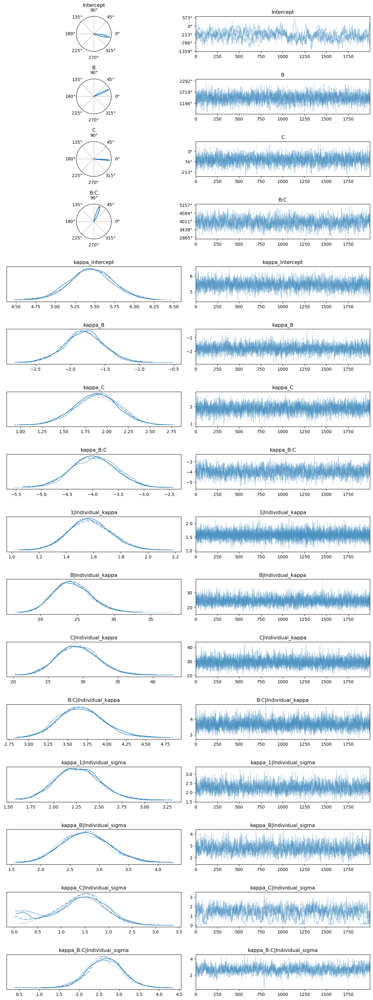

In [9]:
plot_circular_trace(
                    idata = idata_interaction,
                    vars=[
                             "Intercept",
                            "B",
                            "C",
                            "B:C",
                            "kappa_Intercept",
                            "kappa_B",
                            "kappa_C",
                            "kappa_B:C",
                            "1|Individual_kappa",
                            "B|Individual_kappa",
                            "C|Individual_kappa",
                            "B:C|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_B|Individual_sigma",
                            "kappa_C|Individual_sigma",
                            "kappa_B:C|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "B",
                            "C",
                            "B:C",
                            ]
)

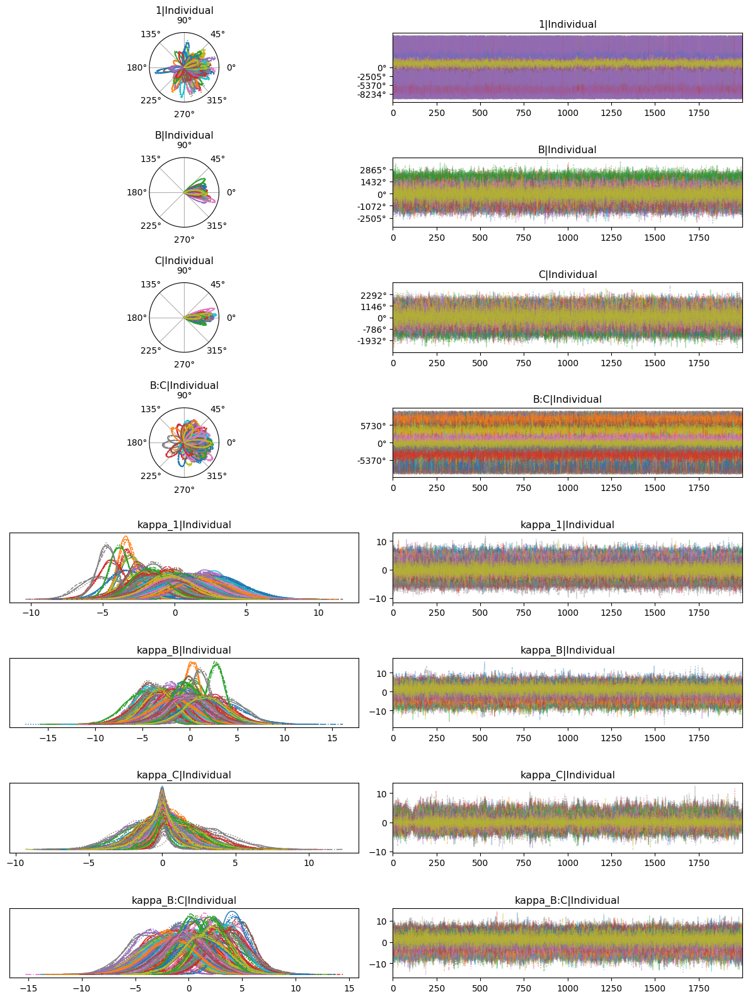

In [10]:
plot_circular_trace(
                    idata = idata_interaction,
vars=[
        "1|Individual",
        "B|Individual",
        "C|Individual",
        "B:C|Individual",
        "kappa_1|Individual",
        "kappa_B|Individual",
        "kappa_C|Individual",
        "kappa_B:C|Individual",
       ],
cvars = [
        "1|Individual",
        "B|Individual",
        "C|Individual",
        "B:C|Individual",
        ]
)

# Model comparison
We would like to test multiple hypotheses about the data:
0. Are all data are explained by individual differences alone?
    - Individual effect
1. Can all differences be explained by stimulus colour?
    - UV effect
2. Can all differences be explained by stimulus brightness?
    - dim effect
3. Does brightness affect accuracy?
    - $\mu \sim$ colour
    - $\kappa \sim$ colour & brightness
4. Does colour affect accuracy?
    - $\mu \sim$ brightness
    - $\kappa \sim$ colour & brightness
5. Can differences be explained by the combined effects of colour and brightness?
    - $\mu \sim$ colour & brightness
    - $\kappa \sim$ colour & brightness
6. Is concentration specific to each combinations of colour and brightness?
    - $\mu \sim$ colour & brightness
    - $\kappa \sim$ colour, brightness & their interaction
7. Is all information about specific combinations of colour and brightness required to explain the data?
    - $\mu \sim$ colour, brightness & their interaction
    - $\kappa \sim$ colour, brightness & their interaction


## Set up alternative models

Firstly, to understand the requirements of lower order models, we need to find appropriate priors for the null model.

In [ ]:
import bambi as bmb
from unwrap.link.bambi import LINKS
from unwrap.link.numpy import inverse_softplus
from unwrap.prior import CircularUniformPrior
from pymc import VonMises
# Define the model formulas
#model 0
formula_null = bmb.Formula(
    "angle ~ 1 + (1 |Individual)",
    "kappa ~ 1 + (1 |Individual)",
)

#model 0
priors_null = {
    # Fixed effects for μ:
    # "Intercept": CircularUniformPrior(), # Works sometimes
    "Intercept": bmb.Prior("VonMises", mu=0, kappa=1), # Test
    # Individual-level effects for μ:
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # Works
    ),
    # Priors for the κ-model (inside the "kappa" dictionary):
    "kappa": {
        # Fixed effects for κ:
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), # Works
        # Individual-level effects for κ:
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Works
        ),
    },
}


#model 0
model_null = bmb.Model(
    formula_null,
    df,
    family="vonmises",
    priors=priors_null,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)


# Fit the model.
idata_null = model_null.fit(draws= 2000,#longer run for mu convergence
                  tune = 1000,
                  progressbar="split+stats",
                #   idata_kwargs={"log_likelihood": True}, #nutpie won't do this
                  nuts_sampler="nutpie",  #build and route via nutpie automatically
                  target_accept= 0.98  # Needs sampling with small steps or generates some divergences 0.95 works
        ) # be prepared for this to take 90 minutes with high adapt delta

#check convergence heuristics
az.summary(
    idata_null, 
    var_names=["Intercept", #slightly right shifted, should converge to around 0.26
               "kappa_Intercept",
                ],
    circ_var_names=["Intercept",
                    ]
)

/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.06,63
,3000,0,0.06,63
,3000,0,0.05,63
,3000,0,0.07,63


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-0.014,0.112,-0.218,0.201,0.010,0.012,45.0,145.0,1.09
kappa_Intercept,1.055,0.108,0.852,1.256,0.003,0.002,1058.0,1962.0,1.00


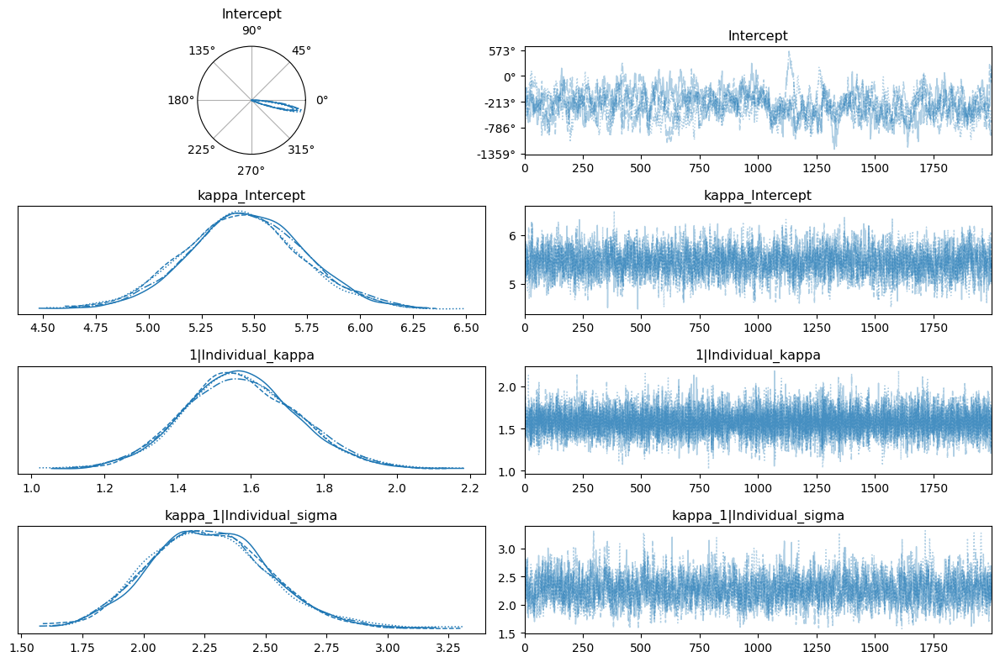

In [12]:
plot_circular_trace(
                    idata = idata_null,
                    vars=[
                            "Intercept",
                            "kappa_Intercept",
                            "1|Individual_kappa",
                            "kappa_1|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            ]
)

In [13]:
import bambi as bmb
# Define the model formulas
#model 0
formula_null = bmb.Formula(
    "angle ~ 1 + (1  |Individual)",
    "kappa ~ 1 + (1  |Individual)",
)

#model 1
formula_UV = bmb.Formula(
    "angle ~ C + (1 + C |Individual)",
    "kappa ~ C + (1 + C |Individual)",
)

#model 2
formula_dim = bmb.Formula(
    "angle ~ B + (1 + B |Individual)",
    "kappa ~ B + (1 + B |Individual)",
)

#model 3
formula_UV_dimKappa = bmb.Formula(
    "angle ~ C + (1 + C |Individual)",
    "kappa ~ B + C + (1 + B + C |Individual)",
)

#model 4
formula_dim_UVKappa = bmb.Formula(
    "angle ~ B + (1 + B |Individual)",
    "kappa ~ B + C + (1 + B + C |Individual)",
)

#model 5
formula_additive = bmb.Formula(
    "angle ~ B + C + (1 + B + C |Individual)",
    "kappa ~ B + C + (1 + B + C |Individual)",
)

#model 6
formula_additive_interactionKappa = bmb.Formula(
    "angle ~ B + C + (1 + B + C |Individual)",
    "kappa ~ B + C + B:C + (1 + B + C + B:C |Individual)",
)

#model 7 already fitted
    # "angle ~ B + C + B:C + (1 + B + C + B:C |Individual)",
    # "kappa ~ B + C + B:C + (1 + B + C + B:C |Individual)",



For the models with a single effect, excess variation and multimodality within each condition can lead to poor convergence. 
By default we therefore assume minimal effects of condition on $\mu$. 

In [ ]:
# Define the model priors


#model 1
priors_UV = {
    # Fixed effects for μ:
    # "Intercept": CircularUniformPrior(),
    # "Intercept": bmb.Prior("VonMises", mu=0, kappa=3), # Works
    "Intercept": bmb.Prior("VonMises", mu=0, kappa=1), # Test
    # "C": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    # Individual-level effects for μ:
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) #  Works
    ),
    "C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(100), sigma=0.60) # Works
    ),
    # Priors for the κ-model (inside the "kappa" dictionary):
    "kappa": {
        # Fixed effects for κ:
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), #  Works
        "C": bmb.Prior("Normal", mu=0, sigma=1.0), # Works
        # Individual-level effects for κ:
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Works
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Works
        ),
    },
}

#model 2
priors_dim = {
    # Fixed effects for μ:
    # "Intercept": bmb.Prior("VonMises", mu=0, kappa=3), #  Works
    # "B": bmb.Prior("Normal", mu=0, sigma=np.pi/12), #  Works
    "Intercept": bmb.Prior("VonMises", mu=0, kappa=1), # Test
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    # Individual-level effects for μ: #
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) #  Works
    ),
    # "B|Individual": bmb.Prior(
    #     "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(100), sigma=0.60) #  Works
    # ),
    "B|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) #  Test
    ),
    # Priors for the κ-model (inside the "kappa" dictionary):
    "kappa": {
        # Fixed effects for κ:
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), #  Works
        # "B": bmb.Prior("Normal", mu=0, sigma=0.3), # Works
        "B": bmb.Prior("Normal", mu=0, sigma=1.0), # Test
        # Individual-level effects for κ:
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Works
        ),
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Works
        ),
    },
}



In [ ]:
#model 3
priors_UV_dimKappa = {
    # μ Model (Only C)
    "Intercept": CircularUniformPrior(), # Works
    # "C": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # Works
    ),
    "C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60)#works
    ),
    # κ Model (B and C)
    "kappa": {
        # "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=0.5),#needs improving
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), # Works
        # "B": bmb.Prior("Normal", mu=0, sigma=0.3),
        # "C": bmb.Prior("Normal", mu=0, sigma=0.3),
        "B": bmb.Prior("Normal", mu=0, sigma=1.0),#Test
        "C": bmb.Prior("Normal", mu=0, sigma=1.0),#Test
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Test
        ),
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) # Test
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0) #Test
        ),
    },
}

#model 4
priors_dim_UVKappa = {
    # μ Model (Only B)
   "Intercept": CircularUniformPrior(),# Works
    # "B": bmb.Prior("Normal", mu=0, sigma=np.pi/12),# Works
    "B": bmb.Prior("Normal", mu=0, sigma=np.pi/2),# Test
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) # Works
    ),
    "B|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) #Works
    ),
    # κ Model (B and C)
    "kappa": {
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), ## Works
        # "B": bmb.Prior("Normal", mu=0, sigma=0.5),## Works
        # "C": bmb.Prior("Normal", mu=0, sigma=0.5),## Works
        "B": bmb.Prior("Normal", mu=0, sigma=1.0),## Test
        "C": bmb.Prior("Normal", mu=0, sigma=1.0),## Test
        # "1|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5)# Works
        # ),
        # "B|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        # "C|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
    },
}

#model 5
priors_additive = {
    # Fixed effects for μ (Angle):
    "Intercept": CircularUniformPrior(),# Works
    # "B": bmb.Prior("Normal", mu=0, sigma=np.pi/12),# Works
    # "C": bmb.Prior("Normal", mu=0, sigma=np.pi/12),# Works
    "B": bmb.Prior("Normal", mu=0, sigma=np.pi/2),# Test
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2),# Test
    
    # Individual-level effects for μ:
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60)# Works
    ),
    "B|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) ## Works
    ),
    "C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60) ## Works
    ),
    
    # Priors for the κ-model:
    "kappa": {
        # Fixed effects for κ:
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), ## Works
        # "B": bmb.Prior("Normal", mu=0, sigma=0.3),# Works
        # "C": bmb.Prior("Normal", mu=0, sigma=0.3),# Works
        "B": bmb.Prior("Normal", mu=0, sigma=1.0),# Test
        "C": bmb.Prior("Normal", mu=0, sigma=1.0),# Test
        
        # Individual-level effects for κ:
        # "1|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5)# Works
        # ),
        # "B|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        # "C|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
    },
}

priors_additive_interactionKappa = {
    # μ Model: Additive (B + C)
    "Intercept": CircularUniformPrior(),# Works mostly
    # "B": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
    # "C": bmb.Prior("Normal", mu=0, sigma=np.pi/12), # Works
    "B": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    "C": bmb.Prior("Normal", mu=0, sigma=np.pi/2), # Test
    
    "1|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60)# Works
    ),
    "B|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60)# Works
    ),
    "C|Individual": bmb.Prior(
        "VonMises", mu=0, kappa=bmb.Prior("LogNormal", mu=np.log(30), sigma=0.60)# Works
    ),
    
    # κ Model: Interaction (B + C + B:C)
    "kappa": {
        # "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=0.5),
        "Intercept": bmb.Prior("Normal", mu=inverse_softplus(3), sigma=3.0), ## Works
        # "B": bmb.Prior("Normal", mu=0, sigma=0.3),# Works
        # "C": bmb.Prior("Normal", mu=0, sigma=0.3),# Works
        # "B:C": bmb.Prior("Normal", mu=0, sigma=0.2), # Works
        "B": bmb.Prior("Normal", mu=0, sigma=1.0),# Test
        "C": bmb.Prior("Normal", mu=0, sigma=1.0),# Test
        "B:C": bmb.Prior("Normal", mu=0, sigma=1.0), # Test
        
        # "1|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5)# Works
        # ),
        # "B|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        # "C|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.3)# Works
        # ),
        # "B:C|Individual": bmb.Prior(
        #     "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=0.5)# Works mostly
        # ),
        "1|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "B|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
        "B:C|Individual": bmb.Prior(
            "Normal", mu=0, sigma=bmb.Prior("HalfStudentT", nu=3, sigma=1.0)# Test
        ),
    },
}

In [16]:

# Prepare all models
#model 1
model_UV = bmb.Model(
    formula_UV,
    df,
    family="vonmises",
    priors=priors_UV,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

#model 2
model_dim = bmb.Model(
    formula_dim,
    df,
    family="vonmises",
    priors=priors_dim,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

#model 3
model_UV_dimKappa = bmb.Model(
    formula_UV_dimKappa,
    df,
    family="vonmises",
    priors=priors_UV_dimKappa,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

#model 4
model_dim_UVKappa = bmb.Model(
    formula_dim_UVKappa,
    df,
    family="vonmises",
    priors=priors_dim_UVKappa,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

#model 5
model_additive = bmb.Model(
    formula_additive,
    df,
    family="vonmises",
    priors=priors_additive,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

#model 6
model_additive_interactionKappa = bmb.Model(
    formula_additive_interactionKappa,
    df,
    family="vonmises",
    priors=priors_additive_interactionKappa,
    link={"mu": LINKS["shifted_modulo"], "kappa": LINKS["softplus"]},
    center_predictors=False,
    dropna=True,
)

## Run model 1
UV (C only)

In [17]:
import numpy as np
import pandas as pd
import bambi as bmb
import arviz as az
import matplotlib.pyplot as plt

# Fit the model.
idata_UV = model_UV.fit(draws= 2000,#longer run for mu convergence
                  tune = 1000,
                  progressbar="split+stats",
                nuts_sampler="nutpie",  #build and route via nutpie automatically
                  target_accept= 0.98  # Needs sampling with small steps or generates some divergences 0.95 works
        ) # be prepared for this to take 90 minutes with high adapt delta
#check convergence heuristics
az.summary(
    idata_UV, 
    var_names=["Intercept", #slightly right shifted, should converge to around 0.26
               "C", 
               "kappa_Intercept",
               "kappa_C",
                ],
    circ_var_names=["Intercept",
                    "C",
                    ]
)


/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.03,255
,3000,0,0.03,255
,3000,0,0.03,255
,3000,0,0.03,255


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.018,0.120,-0.225,0.232,0.007,0.004,467.0,1302.0,1.01
C,-0.027,0.053,-0.125,0.075,0.001,0.001,4763.0,5833.0,1.00
kappa_Intercept,2.441,0.219,2.038,2.856,0.004,0.003,2811.0,3715.0,1.00
kappa_C,-1.587,0.236,-2.033,-1.146,0.004,0.003,3127.0,4090.0,1.00


In [18]:
#check convergence heuristics on random effects
az.summary(
    idata_UV, 
    var_names=[
        "1|Individual_kappa",
        "C|Individual_kappa",
        "kappa_1|Individual_sigma",
        "kappa_C|Individual_sigma",
                ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.227,0.147,0.955,1.501,0.002,0.001,7331.0,5859.0,1.0
C|Individual_kappa,13.065,4.643,5.745,21.955,0.197,0.140,454.0,366.0,1.0
kappa_1|Individual_sigma,1.606,0.161,1.316,1.912,0.003,0.002,2888.0,4829.0,1.0
kappa_C|Individual_sigma,1.511,0.172,1.193,1.831,0.003,0.002,2941.0,5124.0,1.0


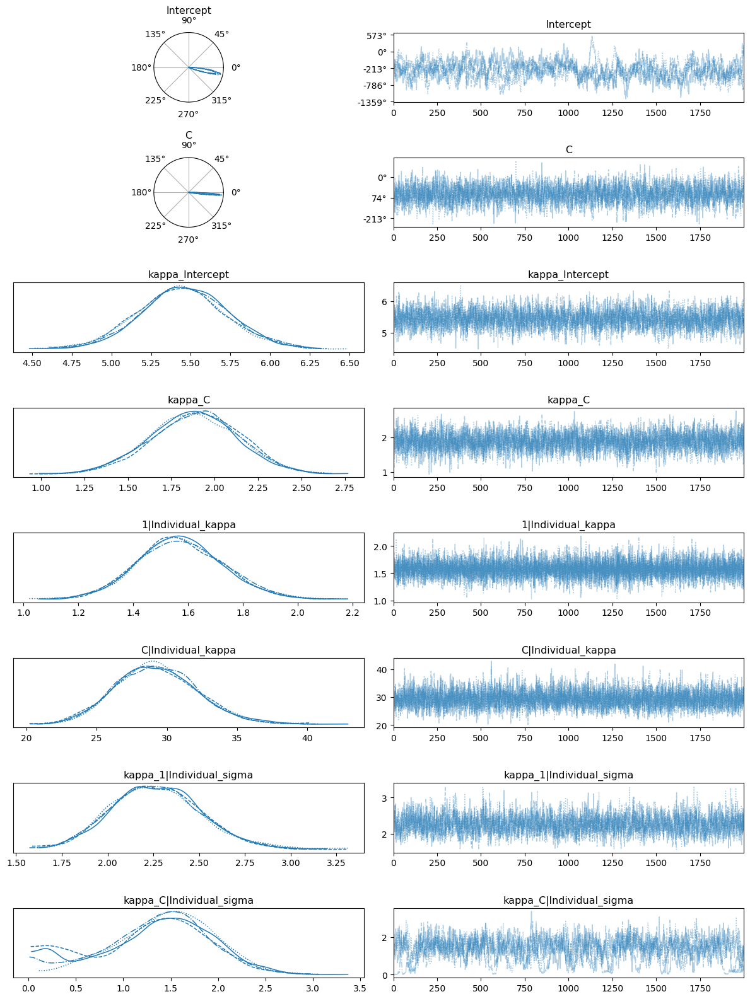

In [19]:
plot_circular_trace(
                    idata = idata_UV,
                    vars=[
                            "Intercept",
                            "C",
                            "kappa_Intercept",
                            "kappa_C",
                            "1|Individual_kappa",
                            "C|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_C|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "C",
                            ]
)

## Run model 2
dim (B only)


In [20]:
# Fit the model.
idata_dim = model_dim.fit(draws= 2000,#longer run for mu convergence
                  tune = 1000,
                  progressbar="split+stats",
                  nuts_sampler="nutpie",  #build and route via nutpie automatically
                  target_accept= 0.98  # Needs sampling with small steps or generates some divergences 0.95 works
        ) # be prepared for this to take 90 minutes with high adapt delta
#check convergence heuristics
az.summary(
    idata_dim, 
    var_names=["Intercept", #slightly right shifted, should converge to around 0.26
               "B", 
                "kappa_Intercept",
               "kappa_B",
                ],
    circ_var_names=["Intercept",
                    "B",
                    ]
)


/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.02,1023
,3000,0,0.02,511
,3000,0,0.02,1023
,3000,0,0.02,511


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.245,0.083,0.084,0.396,0.003,0.003,480.0,909.0,1.01
B,-1.149,0.117,-1.376,-0.931,0.004,0.003,969.0,1989.0,1.00
kappa_Intercept,7.740,0.345,7.101,8.384,0.007,0.005,2720.0,4107.0,1.00
kappa_B,-1.931,0.363,-2.639,-1.266,0.008,0.006,1999.0,3526.0,1.00


In [21]:
#check convergence heuristics on random effects
az.summary(
    idata_dim, 
    var_names=[
        "1|Individual_kappa",
        "B|Individual_kappa",
        "kappa_1|Individual_sigma",
        "kappa_"
        "B|Individual_sigma",
                ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.569,0.159,1.271,1.869,0.002,0.001,9256.0,4837.0,1.0
B|Individual_kappa,1.199,0.152,0.900,1.473,0.002,0.001,5290.0,5355.0,1.0
kappa_1|Individual_sigma,2.698,0.262,2.214,3.200,0.006,0.004,2026.0,3433.0,1.0
kappa_B|Individual_sigma,6.069,0.760,4.716,7.552,0.022,0.015,1214.0,2159.0,1.0


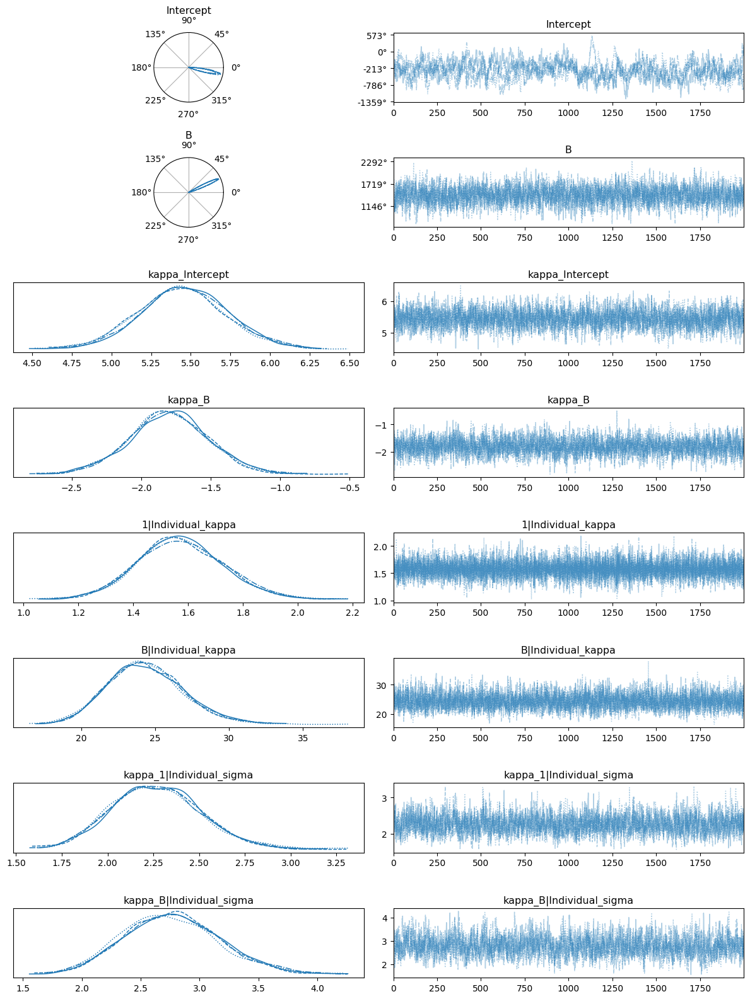

In [22]:
plot_circular_trace(
                    idata = idata_dim,
                    vars=[
                            "Intercept",
                            "B",
                            "kappa_Intercept",
                            "kappa_B",
                            "1|Individual_kappa",
                            "B|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_B|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "B",
                            ]
)

## Run model 3
UV_dimKappa (angle ~ C, kappa ~ B + C)

In [23]:
# Fit the model.
idata_UV_dimKappa = model_UV_dimKappa.fit(draws= 2000,#longer run for mu convergence
                                          tune=1000, 
                                          progressbar="split+stats", 
                                          nuts_sampler="nutpie",  #build and route via nutpie automatically
                                          target_accept=0.98)

# Fixed effects summary
az.summary(idata_UV_dimKappa, 
    var_names=["Intercept", 
               "C", 
               "kappa_Intercept", 
               "kappa_B", 
               "kappa_C"],
    circ_var_names=["Intercept", 
                    "C"])



/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.03,255
,3000,0,0.03,255
,3000,0,0.03,255
,3000,0,0.03,255


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.177,0.100,-0.011,0.363,0.001,0.004,319.0,690.0,1.01
C,0.051,0.036,-0.016,0.119,0.001,0.001,1352.0,3711.0,1.01
kappa_Intercept,9.242,0.592,8.107,10.323,0.032,0.023,341.0,3692.0,1.02
kappa_B,-1.341,0.538,-2.341,-0.362,0.011,0.008,2568.0,4090.0,1.00
kappa_C,-0.275,0.399,-1.010,0.481,0.007,0.005,3370.0,5082.0,1.00


In [24]:
# Random effects summary
az.summary(idata_UV_dimKappa, 
    var_names=["1|Individual_kappa", 
               "C|Individual_kappa", 
               "kappa_1|Individual_sigma", 
               "kappa_B|Individual_sigma", 
               "kappa_C|Individual_sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.327,0.143,1.078,1.610,0.017,0.012,75.0,4186.0,1.04
C|Individual_kappa,30.617,10.792,14.136,49.984,0.496,0.351,465.0,1375.0,1.02
kappa_1|Individual_sigma,5.359,0.519,4.381,6.329,0.084,0.060,37.0,275.0,1.08
kappa_B|Individual_sigma,24.110,3.336,18.275,30.523,0.156,0.111,492.0,1442.0,1.02
kappa_C|Individual_sigma,3.402,0.508,2.482,4.349,0.011,0.008,2050.0,4150.0,1.00


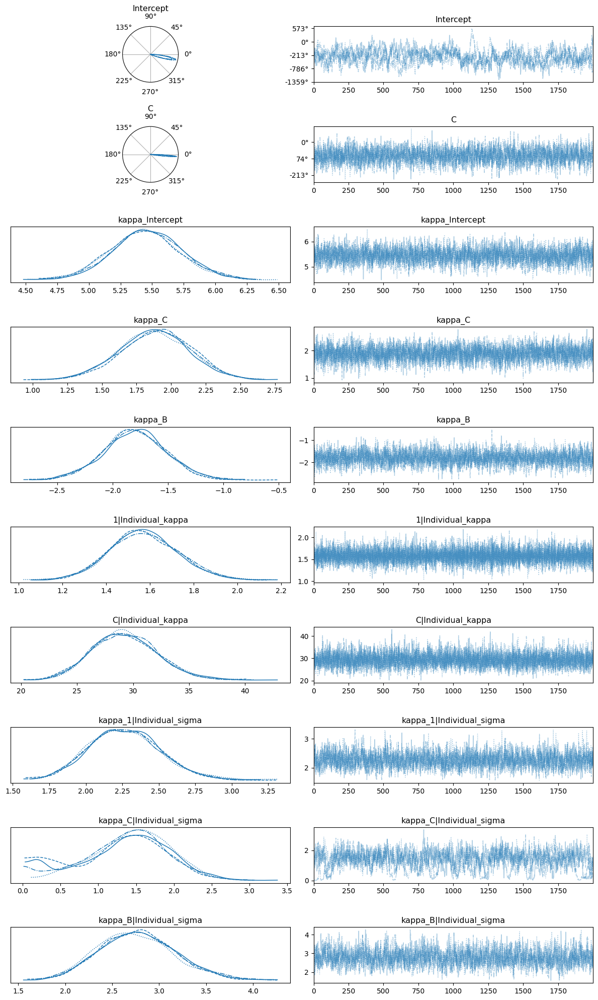

In [25]:
plot_circular_trace(
                    idata = idata_UV_dimKappa,
                    vars=[
                            "Intercept",
                            "C",
                            "kappa_Intercept",
                            "kappa_C",
                            "kappa_B",
                            "1|Individual_kappa",
                            "C|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_C|Individual_sigma",
                            "kappa_B|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "C",
                            ]
)

## Run model 4
Dim_UVKappa (angle ~ B, kappa ~ B + C)

In [26]:
# Fit the model.
idata_dim_UVKappa = model_dim_UVKappa.fit(draws= 2000,#longer run for mu convergence
                                          tune=1000, 
                                          progressbar="split+stats", 
                                          nuts_sampler="nutpie",  #build and route via nutpie automatically
                                          target_accept=0.98)

# Fixed effects summary
az.summary(idata_dim_UVKappa, 
    var_names=["Intercept", 
               "B", 
               "kappa_Intercept",
                "kappa_B", 
                "kappa_C"],
    circ_var_names=["Intercept", 
                    "B"])



/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.03,255
,3000,0,0.03,255
,3000,0,0.02,255
,3000,0,0.03,255


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.254,0.086,0.098,0.418,0.006,0.004,186.0,454.0,1.03
B,-1.165,0.126,-1.388,-0.912,0.006,0.004,470.0,815.0,1.01
kappa_Intercept,6.859,0.375,6.164,7.554,0.010,0.007,1331.0,3212.0,1.00
kappa_B,-5.303,0.272,-5.788,-4.753,0.005,0.004,2848.0,4013.0,1.00
kappa_C,0.811,0.300,0.264,1.393,0.008,0.006,1358.0,3998.0,1.00


In [27]:
# Random effects summary
az.summary(idata_dim_UVKappa, 
    var_names=["1|Individual_kappa", 
               "B|Individual_kappa", 
               "kappa_1|Individual_sigma", 
               "kappa_B|Individual_sigma", 
               "kappa_C|Individual_sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.563,0.153,1.280,1.850,0.001,0.001,13094.0,5164.0,1.00
B|Individual_kappa,1.045,0.144,0.784,1.327,0.003,0.002,3129.0,3937.0,1.00
kappa_1|Individual_sigma,2.252,0.243,1.787,2.698,0.006,0.004,1708.0,2932.0,1.00
kappa_B|Individual_sigma,2.529,0.353,1.913,3.231,0.011,0.008,1018.0,2083.0,1.01
kappa_C|Individual_sigma,2.006,0.247,1.553,2.474,0.006,0.004,1843.0,3326.0,1.00


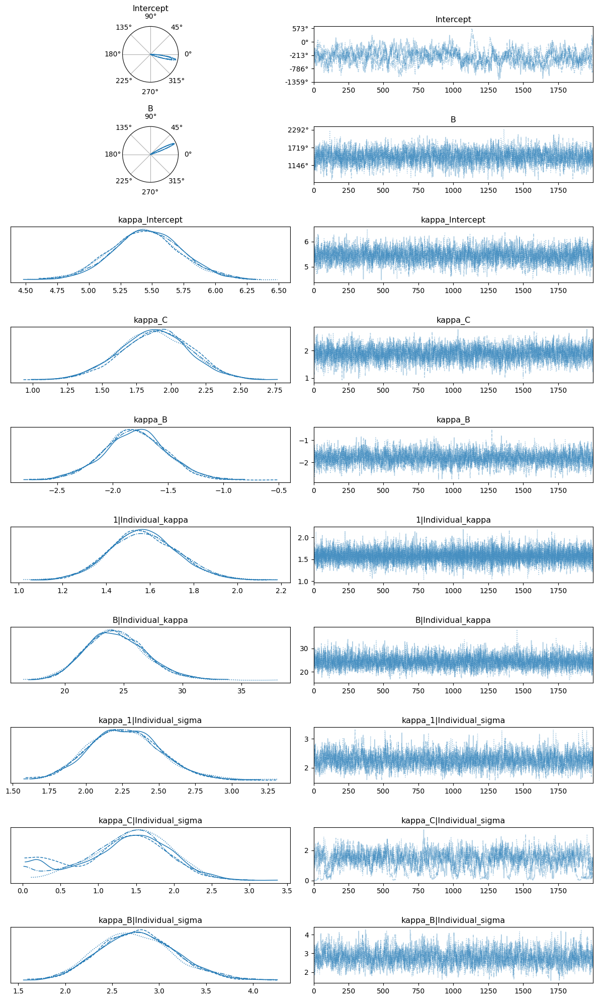

In [28]:
plot_circular_trace(
                    idata = idata_dim_UVKappa,
                    vars=[
                            "Intercept",
                            "B",
                            "kappa_Intercept",
                            "kappa_C",
                            "kappa_B",
                            "1|Individual_kappa",
                            "B|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_C|Individual_sigma",
                            "kappa_B|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "B",
                            ]
)

## Run model 5
Additive (B + C on both)

In [29]:
# Fit the model.
idata_additive = model_additive.fit(draws= 2000,#longer run for mu convergence
                                    tune=1000, 
                                    progressbar="split+stats", 
                                    nuts_sampler="nutpie",  #build and route via nutpie automatically
                                    target_accept=0.98)

# Fixed effects summary
az.summary(idata_additive, 
    var_names=["Intercept", 
               "B", 
               "C", 
               "kappa_Intercept", 
               "kappa_B", 
               "kappa_C"],
    circ_var_names=["Intercept", 
                    "B", 
                    "C"])



/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.02,511
,3000,0,0.02,511
,3000,0,0.02,511
,3000,0,0.02,511


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.264,0.089,0.096,0.430,0.004,0.003,613.0,1241.0,1.0
B,-1.179,0.122,-1.408,-0.951,0.002,0.003,962.0,1711.0,1.0
C,-0.009,0.038,-0.084,0.059,0.001,0.000,3427.0,4740.0,1.0
kappa_Intercept,7.912,0.434,7.147,8.756,0.009,0.006,2345.0,3799.0,1.0
kappa_B,-1.709,0.342,-2.340,-1.056,0.007,0.005,2754.0,3949.0,1.0
kappa_C,0.353,0.248,-0.117,0.811,0.004,0.003,3611.0,6001.0,1.0


In [30]:
# Random effects summary
az.summary(idata_additive, 
    var_names=["1|Individual_kappa", 
               "B|Individual_kappa", 
               "C|Individual_kappa", 
               "kappa_1|Individual_sigma", 
               "kappa_B|Individual_sigma", 
               "kappa_C|Individual_sigma"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.623,0.165,1.311,1.925,0.002,0.001,8213.0,4949.0,1.0
B|Individual_kappa,1.103,0.154,0.811,1.381,0.003,0.002,3175.0,5236.0,1.0
C|Individual_kappa,26.072,9.723,11.136,42.978,0.372,0.263,672.0,1673.0,1.0
kappa_1|Individual_sigma,3.102,0.319,2.511,3.721,0.007,0.005,2283.0,4039.0,1.0
kappa_B|Individual_sigma,6.959,0.766,5.485,8.349,0.021,0.015,1319.0,2756.0,1.0
kappa_C|Individual_sigma,2.477,0.312,1.905,3.068,0.007,0.005,2098.0,4649.0,1.0


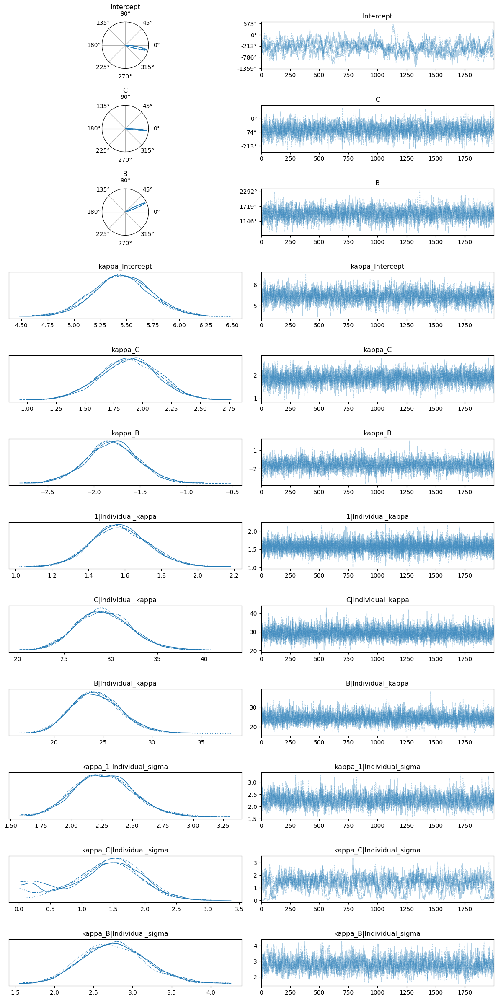

In [31]:
plot_circular_trace(
                    idata = idata_additive,
                    vars=[
                            "Intercept",
                            "C",
                            "B",
                            "kappa_Intercept",
                            "kappa_C",
                            "kappa_B",
                            "1|Individual_kappa",
                            "C|Individual_kappa",
                            "B|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_C|Individual_sigma",
                            "kappa_B|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "C",
                            "B",
                            ]
)

## Run model 6
$\mu$ additive (B + C), $\kappa$ interaction  (B * C)

In [32]:
# Fit the model.
idata_additive_interactionKappa = model_additive_interactionKappa.fit(draws= 2000,#longer run for mu convergence
                                    tune=1000, 
                                    progressbar="split+stats", 
                                    nuts_sampler="nutpie",  #build and route via nutpie automatically
                                    target_accept=0.98)

# Fixed effects summary
az.summary(idata_additive_interactionKappa, 
    var_names=["Intercept", 
               "B", 
               "C", 
               "kappa_Intercept", 
               "kappa_B", 
               "kappa_C",
               "kappa_B:C",
               ],
    circ_var_names=["Intercept", 
                    "B", 
                    "C"])

/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/pymc/sampling/mcmc.py:303: UserWarning: `var_names` are currently ignored by the nutpie sampler
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.03,255
,3000,0,0.02,255
,3000,0,0.02,511
,3000,0,0.02,511


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.257,0.087,0.098,0.424,0.003,0.003,409.0,806.0,1.02
B,-1.138,0.121,-1.360,-0.904,0.005,0.004,574.0,1045.0,1.00
C,-0.005,0.037,-0.077,0.063,0.000,0.001,2423.0,3785.0,1.00
kappa_Intercept,6.947,0.411,6.192,7.732,0.011,0.008,1303.0,3054.0,1.00
kappa_B,-2.077,0.352,-2.722,-1.414,0.009,0.007,1427.0,2411.0,1.00
kappa_C,0.919,0.251,0.480,1.407,0.005,0.003,2667.0,4497.0,1.00
kappa_B:C,-0.644,0.201,-1.027,-0.277,0.004,0.003,2964.0,5901.0,1.01


In [33]:
# Random effects summary
az.summary(idata_additive_interactionKappa, 
    var_names=["1|Individual_kappa", 
               "B|Individual_kappa", 
               "C|Individual_kappa", 
               "kappa_1|Individual_sigma", 
               "kappa_B|Individual_sigma", 
               "kappa_C|Individual_sigma",
               "kappa_B:C|Individual_sigma",
               ])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
1|Individual_kappa,1.618,0.162,1.319,1.923,0.002,0.001,10601.0,5645.0,1.00
B|Individual_kappa,1.101,0.148,0.833,1.392,0.003,0.002,3428.0,4582.0,1.00
C|Individual_kappa,27.938,10.857,11.831,47.575,0.517,0.366,444.0,1063.0,1.01
kappa_1|Individual_sigma,2.572,0.266,2.086,3.081,0.007,0.005,1392.0,2677.0,1.01
kappa_B|Individual_sigma,4.197,0.723,2.898,5.601,0.026,0.018,776.0,1344.0,1.00
kappa_C|Individual_sigma,0.738,0.478,0.001,1.535,0.020,0.014,547.0,1143.0,1.00
kappa_B:C|Individual_sigma,3.861,0.586,2.762,4.931,0.024,0.017,584.0,2514.0,1.02


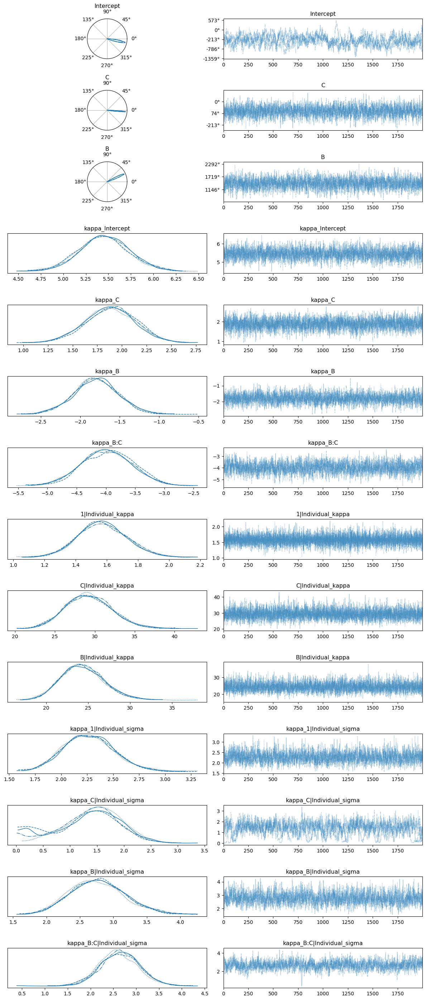

In [34]:
plot_circular_trace(
                    idata = idata_additive_interactionKappa,
                    vars=[
                            "Intercept",
                            "C",
                            "B",
                            "kappa_Intercept",
                            "kappa_C",
                            "kappa_B",
                            "kappa_B:C",
                            "1|Individual_kappa",
                            "C|Individual_kappa",
                            "B|Individual_kappa",
                            "kappa_1|Individual_sigma",
                            "kappa_C|Individual_sigma",
                            "kappa_B|Individual_sigma",
                            "kappa_B:C|Individual_sigma",
                        ],
                    cvars = ["Intercept",
                            "C",
                            "B",
                            ]
)

# Model comparison for hypothesis testing
These models represent different hypotheses about the underlying causes of the data. 
We can test these hypotheses by comparing predictive power.


In [35]:
# Calculate predictive power using LOO cross-validation
import pymc as pm
import arviz as az

# Manually compute and attach the log-likelihood group to your existing idata
model_null.compute_log_likelihood(idata_null)
model_UV.compute_log_likelihood(idata_UV)
model_dim.compute_log_likelihood(idata_dim)
model_UV_dimKappa.compute_log_likelihood(idata_UV_dimKappa)
model_dim_UVKappa.compute_log_likelihood(idata_dim_UVKappa)
model_additive.compute_log_likelihood(idata_additive)
model_additive_interactionKappa.compute_log_likelihood(idata_additive_interactionKappa)
model_interaction.compute_log_likelihood(idata_interaction)

# Compute LOO
loo_null = az.loo(idata_null)
loo_UV = az.loo(idata_UV)
loo_dim = az.loo(idata_dim)
loo_UV_dimKappa = az.loo(idata_UV_dimKappa)
loo_dim_UVKappa = az.loo(idata_dim_UVKappa)
loo_additive = az.loo(idata_additive)
loo_additive_interactionKappa = az.loo(idata_additive_interactionKappa)
loo_interaction = az.loo(idata_interaction)

/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/arviz/stats/stats.py:1039: RuntimeWarning: overflow encountered in exp
  weights = 1 / np.exp(len_scale - len_scale[:, None]).sum(axis=1)
/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/numpy/core/_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/opt/miniconda3/envs/nutpie-env/lib/python3.12/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape paramete

In [36]:
# Print the results
print('\n----- Model 0: no effects -----\n')
print(loo_null)

print('\n----- Model 1: UV (C only) -----\n')
print(loo_UV)

print('\n----- Model 2: Dim (B only) -----\n')
print(loo_dim)

print('\n----- Model 3: UV angle, Dim+UV kappa -----\n')
print(loo_UV_dimKappa)

print('\n----- Model 4: Dim angle, Dim+UV kappa -----\n')
print(loo_dim_UVKappa)

print('\n----- Model 5: Additive (B + C) -----\n')
print(loo_additive)

print('\n----- Model 6: Kappa interaction (B * C) -----\n')
print(loo_additive_interactionKappa)

print('\n----- Model 7: Full interaction (B * C) -----\n')
print(loo_interaction)


----- Model 0: no effects -----

Computed from 8000 posterior samples and 6231 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -9258.27    55.56
p_loo      299.58        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)     6231  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


----- Model 1: UV (C only) -----

Computed from 8000 posterior samples and 6231 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -9076.89    56.69
p_loo      360.11        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)     6231  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%


----- Model 2: Dim (B only) -----

Computed from 8000 posterior samples and 6231 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6248.37    74.22
p_loo      540.98        -

There has been a war


----- Model Comparison Ranking -----

             rank     elpd_loo       p_loo    elpd_diff        weight  \
Interaction     0 -6109.652137  554.410915     0.000000  4.833493e-01   
Additive        1 -6111.843420  623.865886     2.191284  4.888784e-01   
Dim_UVKappa     2 -6147.847182  553.878886    38.195046  5.037796e-08   
Dim (B)         3 -6248.374549  540.978787   138.722412  5.050431e-08   
UV_dimKappa     4 -7034.127698  515.795150   924.475561  2.777234e-02   
UV (C)          5 -9076.887758  360.113211  2967.235621  2.985116e-08   
No effects      6 -9258.273531  299.577522  3148.621394  0.000000e+00   

                    se        dse  warning scale  
Interaction  72.559715   0.000000     True   log  
Additive     74.737210  19.262298     True   log  
Dim_UVKappa  73.129310  20.437222     True   log  
Dim (B)      74.218185  25.323650     True   log  
UV_dimKappa  71.907321  44.892646     True   log  
UV (C)       56.692160  60.053602    False   log  
No effects   55.557

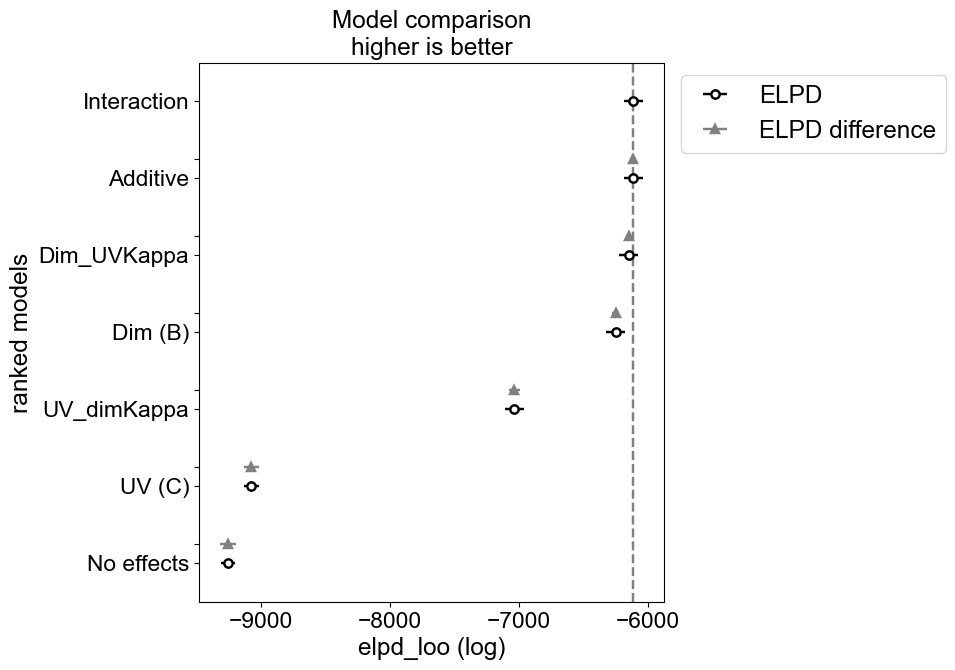

In [ ]:
import matplotlib as mpl

# Ensure text is output as editable TrueType text elements in PDFs
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# Optional: Use standard Arial/Helvetica to guarantee font compatibility across systems
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'Computer Modern Sans Serif']

# Compare, ranking models from best to worst
comparison = az.compare({
    'No effects': loo_null,
    'UV (C)': loo_UV,
    'Dim (B)': loo_dim,
    'UV_dimKappa': loo_UV_dimKappa,
    'Dim_UVKappa': loo_dim_UVKappa,
    'Additive': loo_additive,
    'Additive_interKappa': loo_additive_interactionKappa,
    'Interaction': loo_interaction
}, ic="loo")

print('\n----- Model Comparison Ranking -----\n')
print(comparison)

# Visualize the comparison
ax_compare = az.plot_compare(comparison)

# Extract the parent figure belonging to that specific axis
fig_compare = ax_compare.get_figure()
fig_compare.savefig("0Figures/model_comparison.pdf", format="pdf", bbox_inches="tight")

## Plot model comparison
Plot relative and contrasted ELPD for the models of interest.

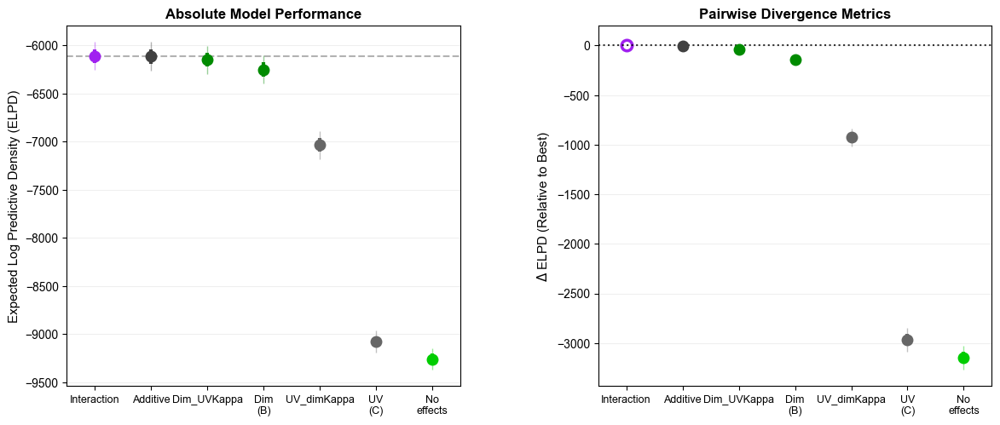

In [ ]:
import numpy as np
import arviz as az
import matplotlib as mpl

# Ensure the output PDF retains fully editable TrueType text elements
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# Extract models exactly as they are ordered in the comparison table
models = comparison.index.tolist()

# -------------------------------------------------------------------------
# Define an explicit color map linking your model names to hex codes.
# This prevents colors from decoupling if ArviZ shifts model rankings.
# -------------------------------------------------------------------------
color_map = {
    'Interaction': '#A020F0',   # Purple
    'Additive_InterKappa': '#A020F0',   # Purple
    'Additive': '#404040',      # Dark Grey
    'Dim_UVKappa': '#008B00',   # Forest Green
    'Dim (B)': '#008B00',       # Forest Green (Shared condition)
    'UV_dimKappa': '#666666',   # Muted Grey
    'UV (C)': '#666666',#'#CD00CD',        # Magenta
    'No effects': '#00CD00'     # Bright Green
}

# -------------------------------------------------------------------------
# Set up the dual-panel canvas
# -------------------------------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5.5), sharex=False)
fig.subplots_adjust(wspace=0.35)

# =========================================================================
# PANEL 1: Absolute ELPD Estimates (Ranked Best to Worst)
# =========================================================================
for i, model in enumerate(models):
    elpd = comparison.loc[model, "elpd_loo"]
    se = comparison.loc[model, "se"]
    color = color_map.get(model, "#000000") # Fallback to black if a new model name appears
    
    # Plot point estimate and 1-sigma / 2-sigma error bounds
    ax1.errorbar(x=i, y=elpd, yerr=se, fmt='o', color=color, elinewidth=3, markersize=9, label=model)
    ax1.errorbar(x=i, y=elpd, yerr=2*se, fmt='none', color=color, elinewidth=1, alpha=0.4)

# Visual anchors for Panel 1
ax1.axhline(comparison.iloc[0]["elpd_loo"], color="gray", linestyle="--", alpha=0.6)
ax1.set_title("Absolute Model Performance", fontsize=12, fontweight='bold')
ax1.set_ylabel("Expected Log Predictive Density (ELPD)", fontsize=11)
ax1.set_xticks(range(len(models)))
ax1.set_xticklabels([m.replace(" ", "\n") for m in models], fontsize=9)
ax1.set_xlim(-0.5, len(models) - 0.5)
ax1.grid(True, axis='y', alpha=0.2)

# =========================================================================
# PANEL 2: Relative ELPD Differences (From Best)
# =========================================================================
for i, model in enumerate(models):
    elpd_diff = comparison.loc[model, "elpd_diff"]
    se_diff = comparison.loc[model, "dse"]
    color = color_map.get(model, "#000000")
    
    if i == 0:
        # Best model serves as the baseline comparison point (diff=0, se=0)
        ax2.plot(i, -elpd_diff, 'o', fillstyle='none', color=color, markersize=9, markeredgewidth=2.5)
    else:
        # ArviZ records elpd_diff as positive values tracking distance down from best. 
        # We invert it (-elpd_diff) to match a downward drop layout.
        ax2.errorbar(x=i, y=-elpd_diff, yerr=se_diff, fmt='o', color=color, elinewidth=3, markersize=9)
        ax2.errorbar(x=i, y=-elpd_diff, yerr=2*se_diff, fmt='none', color=color, elinewidth=1, alpha=0.4)

# Visual anchors for Panel 2
ax2.axhline(0, color="black", linestyle=":", alpha=0.8)
ax2.set_title("Pairwise Divergence Metrics", fontsize=12, fontweight='bold')
ax2.set_ylabel(r"$\Delta$ ELPD (Relative to Best)", fontsize=11)
ax2.set_xticks(range(len(models)))
ax2.set_xticklabels([m.replace(" ", "\n") for m in models], fontsize=9)
ax2.set_xlim(-0.5, len(models) - 0.5)
ax2.grid(True, axis='y', alpha=0.2)

# Save vector graphic output and display layout
plt.show()
fig.savefig("0Figures/model_comparison_split.pdf", format="pdf", bbox_inches="tight")

# Extract & inspect posterior samples from maximal model

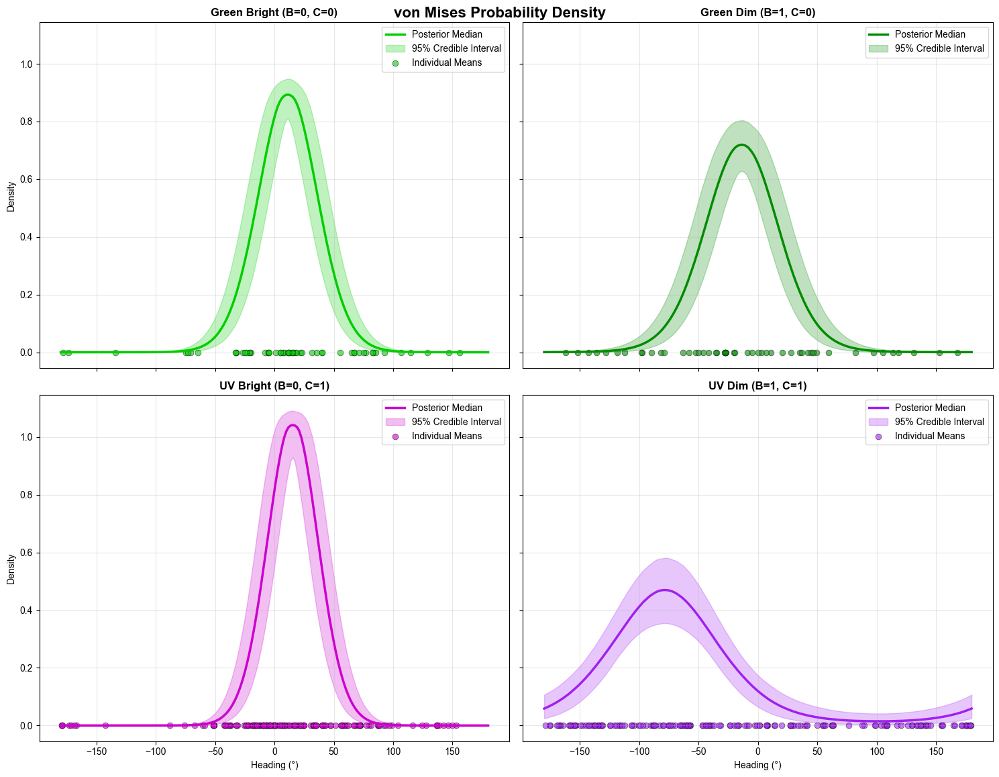

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import vonmises, circmean
from unwrap.link.numpy import shifted_modulo, softplus

# --------------------------------------------------
# Extract posterior samples for population-level parameters
# --------------------------------------------------
mu_intercept = idata_interaction.posterior['Intercept'].values          
mu_slopeB    = idata_interaction.posterior['B'].values               
mu_slopeC    = idata_interaction.posterior['C'].values               
mu_slopeBC   = idata_interaction.posterior['B:C'].values               

kappa_intercept = idata_interaction.posterior['kappa_Intercept'].values    
kappa_slopeB    = idata_interaction.posterior['kappa_B'].values        
kappa_slopeC    = idata_interaction.posterior['kappa_C'].values        
kappa_slopeBC   = idata_interaction.posterior['kappa_B:C'].values        

# --------------------------------------------------
# Prepare data grid
# --------------------------------------------------
theta = np.linspace(-np.pi, np.pi, 200)
theta_deg = theta * 180 / np.pi
num_samples = mu_intercept.flatten().shape[0]

# Compute population-level parameters for each condition
mu_pop_gh_samples_all = shifted_modulo(mu_intercept.flatten())
mu_pop_gl_samples_all  = shifted_modulo((mu_intercept + mu_slopeB).flatten())
mu_pop_uh_samples_all  = shifted_modulo((mu_intercept + mu_slopeC).flatten())
mu_pop_ul_samples_all  = shifted_modulo((mu_intercept + mu_slopeB + mu_slopeC + mu_slopeBC).flatten())

kappa_pop_gh_samples_all = softplus(kappa_intercept.flatten())
kappa_pop_gl_samples_all  = softplus((kappa_intercept + kappa_slopeB).flatten())
kappa_pop_uh_samples_all = softplus(kappa_intercept.flatten() + kappa_slopeC.flatten()) # Fixed: Match formula syntax safely
kappa_pop_ul_samples_all  = softplus((kappa_intercept + kappa_slopeB + kappa_slopeC + kappa_slopeBC).flatten())

# --------------------------------------------------
# Compute von Mises PDFs
# --------------------------------------------------
pdf_gh = vonmises.pdf(theta[None, :], kappa=kappa_pop_gh_samples_all[:, None], loc=mu_pop_gh_samples_all[:, None])
pdf_gl = vonmises.pdf(theta[None, :], kappa=kappa_pop_gl_samples_all[:, None], loc=mu_pop_gl_samples_all[:, None])
pdf_uh = vonmises.pdf(theta[None, :], kappa=kappa_pop_uh_samples_all[:, None], loc=mu_pop_uh_samples_all[:, None])
pdf_ul = vonmises.pdf(theta[None, :], kappa=kappa_pop_ul_samples_all[:, None], loc=mu_pop_ul_samples_all[:, None])

# Calculate medians and true 95% Credible Intervals (2.5% to 97.5%)
median_pdf_gh = np.median(pdf_gh, axis=0)
lower_pdf_gh  = np.percentile(pdf_gh, 2.5, axis=0)
upper_pdf_gh  = np.percentile(pdf_gh, 97.5, axis=0)

median_pdf_gl = np.median(pdf_gl, axis=0)
lower_pdf_gl  = np.percentile(pdf_gl, 2.5, axis=0)
upper_pdf_gl  = np.percentile(pdf_gl, 97.5, axis=0)

median_pdf_uh = np.median(pdf_uh, axis=0)
lower_pdf_uh  = np.percentile(pdf_uh, 2.5, axis=0)
upper_pdf_uh  = np.percentile(pdf_uh, 97.5, axis=0)

median_pdf_ul = np.median(pdf_ul, axis=0)
lower_pdf_ul  = np.percentile(pdf_ul, 2.5, axis=0)
upper_pdf_ul  = np.percentile(pdf_ul, 97.5, axis=0)

# --------------------------------------------------
# Setup 2x2 Subplot Grid with Hex Color Codes
# --------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(15, 12), sharex=True, sharey=True)
((ax1, ax2), (ax3, ax4)) = axes

conditions = [
    {"ax": ax1, "med": median_pdf_gh, "low": lower_pdf_gh, "up": upper_pdf_gh, "color": "#00CD00", "title": "Green Bright (B=0, C=0)", "b_val": 0, "c_val": 0},
    {"ax": ax2, "med": median_pdf_gl, "low": lower_pdf_gl, "up": upper_pdf_gl, "color": "#008B00", "title": "Green Dim (B=1, C=0)", "b_val": 1, "c_val": 0},
    {"ax": ax3, "med": median_pdf_uh, "low": lower_pdf_uh, "up": upper_pdf_uh, "color": "#CD00CD", "title": "UV Bright (B=0, C=1)", "b_val": 0, "c_val": 1},
    {"ax": ax4, "med": median_pdf_ul, "low": lower_pdf_ul, "up": upper_pdf_ul, "color": "#A020F0", "title": "UV Dim (B=1, C=1)", "b_val": 1, "c_val": 1}
]

# Plot density and intervals per panel using updated colors
for cond in conditions:
    ax = cond["ax"]
    ax.plot(theta_deg, cond["med"], color=cond["color"], lw=2.5, label="Posterior Median")
    ax.fill_between(theta_deg, cond["low"], cond["up"], color=cond["color"], alpha=0.25, label="95% Credible Interval")
    ax.set_title(cond["title"], fontsize=12, fontweight="bold")
    ax.grid(True, alpha=0.3)

# --------------------------------------------------
# Calculate and Overlap Individual Summary Means
# --------------------------------------------------
for i, individual in enumerate(df['Individual'].unique()):
    individual_data = df[df['Individual'] == individual]
    
    for cond in conditions:
        # Extract observations specific to this condition panel
        headings = individual_data.loc[(individual_data['B'] == cond["b_val"]) & (individual_data['C'] == cond["c_val"]), 'angle'].dropna()
        
        if len(headings) > 0:
            ind_circmean = shifted_modulo(circmean(headings))
            cond["ax"].scatter(
                ind_circmean * 180 / np.pi, 0, 
                color=cond["color"], edgecolor='black', linewidth=0.5, 
                s=40, alpha=0.6, 
                label='Individual Means' if i == 0 else ""
            )

# Global formatting details
for ax in axes.flat:
    ax.set_xlabel('Heading (°)')
    ax.set_ylabel('Density')
    ax.label_outer() # Hides inner labels to avoid overlap clutter
    ax.legend(loc="upper right", frameon=True, facecolor="white", framealpha=0.8)

plt.suptitle('von Mises Probability Density', fontsize=16, fontweight="bold", y=0.96)
plt.tight_layout()
plt.show()